In [73]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,precision_score,recall_score,f
import matplotlib.pyplot as plt
from sklearn import tree
import seaborn as sns
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 1000
sns.set_theme(style='darkgrid', palette='rainbow')
import warnings
warnings.filterwarnings('ignore')

In [34]:
#1. Exploratory Data Analysis (EDA):
df = pd.read_csv(r"C:\Users\Dell\Downloads\archive (2)\glass.csv")
df

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.00,0.0,1
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.00,0.0,1
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.00,0.0,1
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.00,0.0,1
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.00,0.0,1
...,...,...,...,...,...,...,...,...,...,...
209,1.51623,14.14,0.00,2.88,72.61,0.08,9.18,1.06,0.0,7
210,1.51685,14.92,0.00,1.99,73.06,0.00,8.40,1.59,0.0,7
211,1.52065,14.36,0.00,2.02,73.42,0.00,8.44,1.64,0.0,7
212,1.51651,14.38,0.00,1.94,73.61,0.00,8.48,1.57,0.0,7


In [35]:
df.describe()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
count,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000
mean,1.518365,13.407850,2.684533,1.444907,72.650935,0.497056,8.956963,0.175047,0.057009,2.780374
std,0.003037,0.816604,1.442408,0.499270,0.774546,0.652192,1.423153,0.497219,0.097439,2.103739
min,1.511150,10.730000,0.000000,0.290000,69.810000,0.000000,5.430000,0.000000,0.000000,1.000000
25%,1.516522,12.907500,2.115000,1.190000,72.280000,0.122500,8.240000,0.000000,0.000000,1.000000
50%,1.517680,13.300000,3.480000,1.360000,72.790000,0.555000,8.600000,0.000000,0.000000,2.000000
75%,1.519157,13.825000,3.600000,1.630000,73.087500,0.610000,9.172500,0.000000,0.100000,3.000000
max,1.533930,17.380000,4.490000,3.500000,75.410000,6.210000,16.190000,3.150000,0.510000,7.000000


In [4]:
df.head()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.0,0.0,1
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.0,0.0,1
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.0,0.0,1
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.0,0.0,1
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.0,0.0,1


In [5]:
df.tail()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
209,1.51623,14.14,0.0,2.88,72.61,0.08,9.18,1.06,0.0,7
210,1.51685,14.92,0.0,1.99,73.06,0.00,8.40,1.59,0.0,7
211,1.52065,14.36,0.0,2.02,73.42,0.00,8.44,1.64,0.0,7
212,1.51651,14.38,0.0,1.94,73.61,0.00,8.48,1.57,0.0,7
213,1.51711,14.23,0.0,2.08,73.36,0.00,8.62,1.67,0.0,7


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 214 entries, 0 to 213
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   RI      214 non-null    float64
 1   Na      214 non-null    float64
 2   Mg      214 non-null    float64
 3   Al      214 non-null    float64
 4   Si      214 non-null    float64
 5   K       214 non-null    float64
 6   Ca      214 non-null    float64
 7   Ba      214 non-null    float64
 8   Fe      214 non-null    float64
 9   Type    214 non-null    int64  
dtypes: float64(9), int64(1)
memory usage: 16.8 KB


In [7]:
#checking for missing values
df.isnull().sum()

RI      0
Na      0
Mg      0
Al      0
Si      0
K       0
Ca      0
Ba      0
Fe      0
Type    0
dtype: int64

Data visualization

In [8]:
# Histograms
df.hist(figsize=(12, 10))

array([[<Axes: title={'center': 'RI'}>, <Axes: title={'center': 'Na'}>,
        <Axes: title={'center': 'Mg'}>],
       [<Axes: title={'center': 'Al'}>, <Axes: title={'center': 'Si'}>,
        <Axes: title={'center': 'K'}>],
       [<Axes: title={'center': 'Ca'}>, <Axes: title={'center': 'Ba'}>,
        <Axes: title={'center': 'Fe'}>],
       [<Axes: title={'center': 'Type'}>, <Axes: >, <Axes: >]],
      dtype=object)

In [9]:
df.boxplot(figsize=(15,10))

<Axes: >

In [10]:
sns.pairplot(df)  

<Axes: >

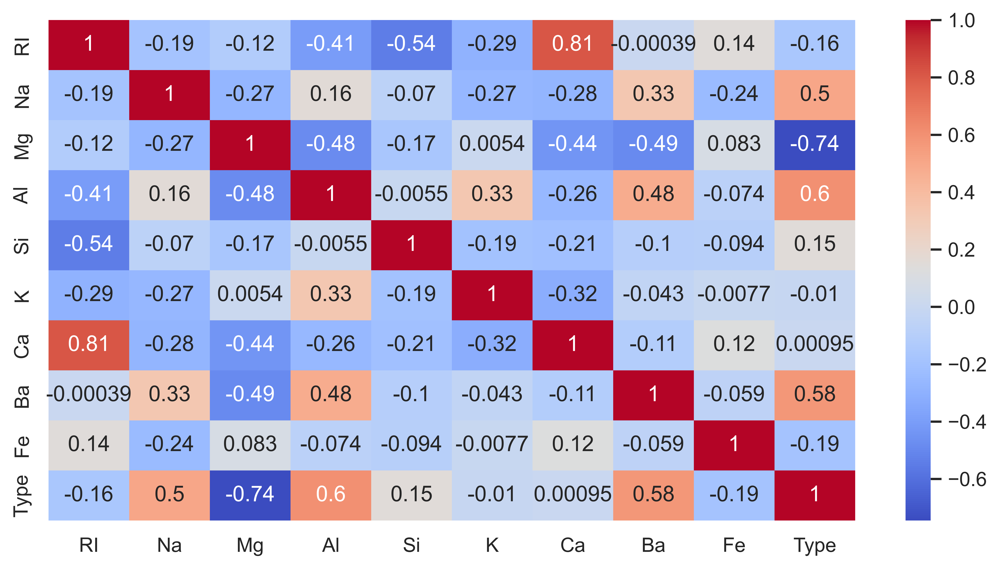

In [11]:
corr = df.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')

<Axes: xlabel='Type', ylabel='count'>

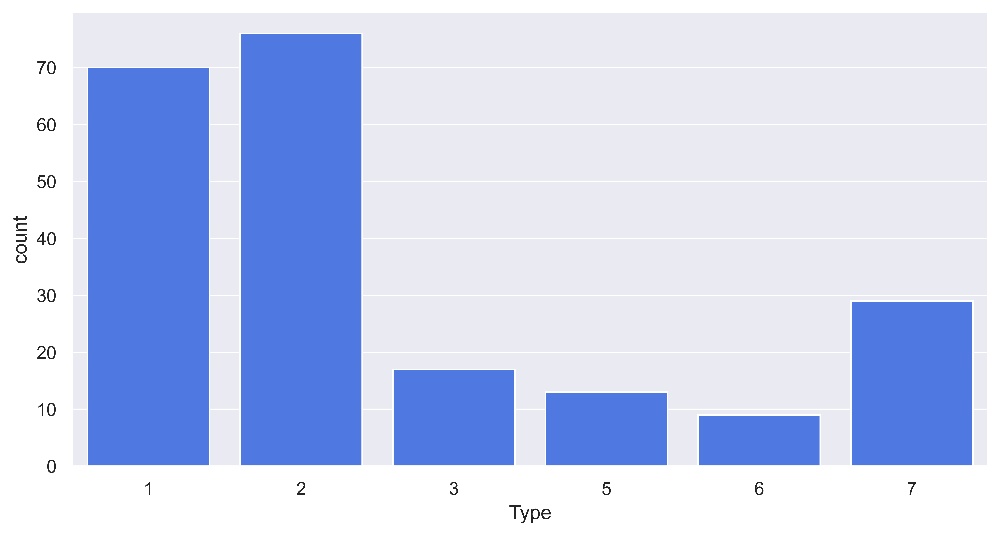

In [39]:
sns.countplot(x = df['Type'])

In [40]:
df['Type'].replace([1,2,3,4,5,6,7],['building_windows_float_processed','building_windows_non_float_processed','vehicle_windows_float_processed','vehicle_windows_non_float_processed (none in this database)','containers','tableware','headlamps'], inplace=True)

In [41]:
df

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.00,0.0,building_windows_float_processed
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.00,0.0,building_windows_float_processed
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.00,0.0,building_windows_float_processed
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.00,0.0,building_windows_float_processed
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.00,0.0,building_windows_float_processed
...,...,...,...,...,...,...,...,...,...,...
209,1.51623,14.14,0.00,2.88,72.61,0.08,9.18,1.06,0.0,headlamps
210,1.51685,14.92,0.00,1.99,73.06,0.00,8.40,1.59,0.0,headlamps
211,1.52065,14.36,0.00,2.02,73.42,0.00,8.44,1.64,0.0,headlamps
212,1.51651,14.38,0.00,1.94,73.61,0.00,8.48,1.57,0.0,headlamps


4: Random Forest Model Implementation

In [42]:
x = df.drop(columns='Type')
y = df['Type']

In [43]:
x

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.00,0.0
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.00,0.0
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.00,0.0
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.00,0.0
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.00,0.0
...,...,...,...,...,...,...,...,...,...
209,1.51623,14.14,0.00,2.88,72.61,0.08,9.18,1.06,0.0
210,1.51685,14.92,0.00,1.99,73.06,0.00,8.40,1.59,0.0
211,1.52065,14.36,0.00,2.02,73.42,0.00,8.44,1.64,0.0
212,1.51651,14.38,0.00,1.94,73.61,0.00,8.48,1.57,0.0


In [44]:
y

0      building_windows_float_processed
1      building_windows_float_processed
2      building_windows_float_processed
3      building_windows_float_processed
4      building_windows_float_processed
                     ...               
209                           headlamps
210                           headlamps
211                           headlamps
212                           headlamps
213                           headlamps
Name: Type, Length: 214, dtype: object

In [45]:
from sklearn.preprocessing import StandardScaler

In [46]:
sc = StandardScaler()
x = sc.fit_transform(x)
x

array([[ 0.87286765,  0.28495326,  1.25463857, ..., -0.14576634,
        -0.35287683, -0.5864509 ],
       [-0.24933347,  0.59181718,  0.63616803, ..., -0.79373376,
        -0.35287683, -0.5864509 ],
       [-0.72131806,  0.14993314,  0.60142249, ..., -0.82894938,
        -0.35287683, -0.5864509 ],
       ...,
       [ 0.75404635,  1.16872135, -1.86551055, ..., -0.36410319,
         2.95320036, -0.5864509 ],
       [-0.61239854,  1.19327046, -1.86551055, ..., -0.33593069,
         2.81208731, -0.5864509 ],
       [-0.41436305,  1.00915211, -1.86551055, ..., -0.23732695,
         3.01367739, -0.5864509 ]])

In [47]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [48]:
x_test

array([[-2.69137018e-01, -5.00618371e-01,  6.36168030e-01,
        -1.70460232e-01,  4.38786730e-01,  1.12106515e-01,
        -3.92275686e-01, -3.52876828e-01,  5.45110920e-01],
       [-3.61553581e-01,  1.58605628e+00, -1.86551055e+00,
         1.79700922e+00,  8.14077586e-01, -7.63918639e-01,
        -4.90385747e-03,  9.77617652e-01, -5.86450902e-01],
       [ 1.04119781e+00, -4.39245587e-01,  6.70913566e-01,
        -1.15419496e+00, -5.57675197e-01, -4.71910254e-01,
         6.28977316e-01, -3.52876828e-01,  1.16232646e+00],
       [-7.74127520e-01,  1.77017463e+00, -1.86551055e+00,
         1.87731409e+00,  8.14077586e-01, -7.63918639e-01,
        -1.38723216e-01,  9.37299637e-01,  3.39372407e-01],
       [-4.24264820e-01,  3.83149716e-01,  6.91760888e-01,
         7.32969618e-01, -7.64732220e-01,  2.19688551e-01,
        -7.58518141e-01, -3.52876828e-01, -5.86450902e-01],
       [ 2.97864503e+00, -2.93098061e+00, -1.86551055e+00,
        -1.39510958e+00,  5.55256306e-01, -7.639186

In [49]:
rfc = RandomForestClassifier()
rfc.fit(x_train,y_train)
yp = rfc.predict(x_test)
yp

array(['building_windows_float_processed', 'headlamps',
       'building_windows_float_processed', 'headlamps',
       'building_windows_non_float_processed',
       'building_windows_non_float_processed',
       'building_windows_float_processed',
       'building_windows_non_float_processed',
       'building_windows_non_float_processed',
       'building_windows_float_processed', 'tableware',
       'building_windows_non_float_processed',
       'building_windows_float_processed',
       'building_windows_non_float_processed', 'tableware', 'containers',
       'headlamps', 'building_windows_float_processed',
       'building_windows_float_processed', 'tableware',
       'building_windows_non_float_processed', 'headlamps', 'headlamps',
       'headlamps', 'vehicle_windows_float_processed',
       'building_windows_non_float_processed',
       'building_windows_float_processed',
       'building_windows_float_processed',
       'building_windows_non_float_processed',
       'building_

In [50]:
print(confusion_matrix(y_test,yp))

[[11  0  0  0  0  0]
 [ 3 10  0  1  0  0]
 [ 0  2  2  0  0  0]
 [ 0  0  0  8  0  0]
 [ 0  0  0  0  3  0]
 [ 1  0  0  0  0  2]]


In [51]:
accuracy_score(y_test,yp)

0.8372093023255814

In [52]:
len(rfc.estimators_)

100

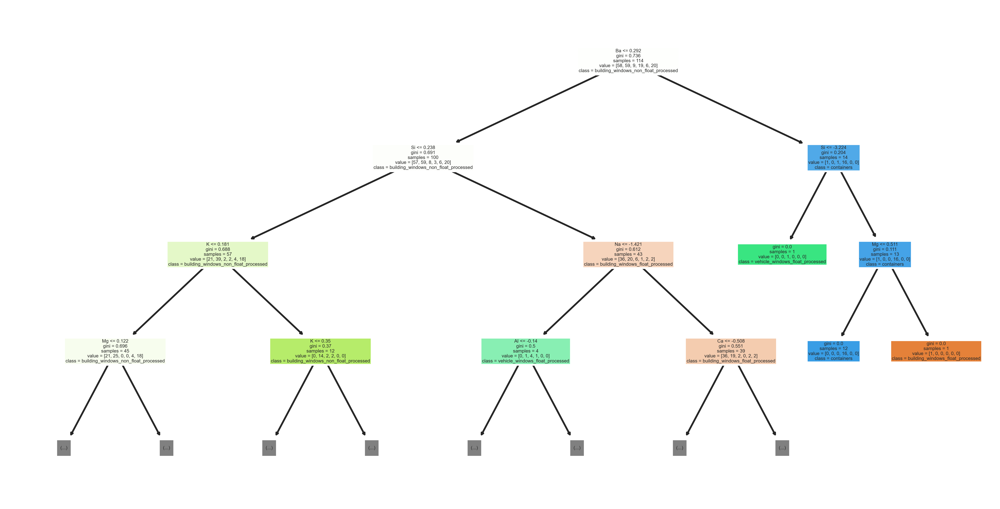

In [54]:
tree.plot_tree(rfc.estimators_[75], feature_names=['RI','Na','Mg','AI','Si','K','Ca','Ba','Fe'],
               class_names=df['Type'].unique(),
               filled=True , max_depth=3)
plt.show()

# 5: Bagging and Boosting Methods
Apply the Bagging and Boosting methods and compare the results.


In [56]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

In [57]:
# Bagging with Decision Tree
bagging_clf = BaggingClassifier(
    base_estimator=DecisionTreeClassifier(),
    n_estimators=100,
    random_state=42
)

In [58]:
bagging_clf.fit(x_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=100,
                  random_state=42)

In [61]:
y_pred1 = bagging_clf.predict(x_test)
y_pred1

array(['building_windows_float_processed', 'headlamps',
       'building_windows_float_processed', 'headlamps',
       'building_windows_non_float_processed',
       'building_windows_non_float_processed',
       'building_windows_float_processed',
       'building_windows_non_float_processed',
       'building_windows_non_float_processed',
       'vehicle_windows_float_processed', 'tableware', 'containers',
       'building_windows_float_processed',
       'building_windows_non_float_processed', 'tableware', 'containers',
       'headlamps', 'building_windows_float_processed',
       'building_windows_float_processed', 'tableware',
       'building_windows_non_float_processed', 'headlamps', 'headlamps',
       'headlamps', 'vehicle_windows_float_processed',
       'building_windows_non_float_processed',
       'building_windows_float_processed',
       'building_windows_float_processed', 'containers',
       'building_windows_float_processed',
       'building_windows_float_processed'

In [62]:
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.4f}')

Accuracy: 0.8605


In [64]:
from sklearn.ensemble import AdaBoostClassifier

In [65]:
de = DecisionTreeClassifier(max_depth=1)

In [68]:
ada = AdaBoostClassifier(base_estimator = de,n_estimators=50,learning_rate=1.0,random_state=42)

In [69]:
ada.fit(x_train,y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1),
                   random_state=42)

In [71]:
y_pred = ada.predict(x_test)
y_pred

array(['building_windows_float_processed',
       'building_windows_non_float_processed',
       'building_windows_float_processed',
       'building_windows_non_float_processed',
       'building_windows_float_processed', 'tableware',
       'building_windows_float_processed',
       'building_windows_float_processed',
       'building_windows_float_processed',
       'building_windows_non_float_processed', 'tableware',
       'building_windows_non_float_processed',
       'building_windows_float_processed',
       'building_windows_float_processed', 'tableware',
       'building_windows_non_float_processed',
       'building_windows_non_float_processed',
       'building_windows_float_processed',
       'building_windows_float_processed', 'tableware',
       'building_windows_non_float_processed', 'headlamps',
       'building_windows_non_float_processed', 'headlamps',
       'building_windows_float_processed',
       'building_windows_non_float_processed',
       'building_windows_f

In [72]:
accuracy = accuracy_score(y_test, y_pred)
print(f'AdaBoost Accuracy: {accuracy}')

AdaBoost Accuracy: 0.4883720930232558


In [81]:
from sklearn.ensemble import GradientBoostingClassifier

In [82]:
boost = GradientBoostingClassifier(n_estimators=100,learning_rate=1.0,max_depth=3,random_state=42)

In [83]:
boost.fit(x_train,y_train)

GradientBoostingClassifier(learning_rate=1.0, random_state=42)

In [84]:
y_pred = boost.predict(x_test)
y_pred

array(['building_windows_float_processed', 'headlamps',
       'building_windows_float_processed', 'headlamps',
       'building_windows_non_float_processed',
       'building_windows_non_float_processed',
       'building_windows_float_processed',
       'building_windows_non_float_processed',
       'building_windows_non_float_processed',
       'building_windows_float_processed',
       'building_windows_non_float_processed',
       'building_windows_non_float_processed',
       'building_windows_non_float_processed',
       'building_windows_non_float_processed', 'tableware', 'containers',
       'tableware', 'building_windows_float_processed',
       'building_windows_float_processed',
       'building_windows_non_float_processed',
       'building_windows_non_float_processed', 'headlamps', 'headlamps',
       'headlamps', 'vehicle_windows_float_processed',
       'building_windows_float_processed',
       'building_windows_float_processed',
       'building_windows_float_processe

In [85]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Gradient Boosting Accuracy: {accuracy}')

Gradient Boosting Accuracy: 0.7674418604651163


In [ ]:
#Bagging (Bootstrap Aggregating) involves training multiple models independently on different random subsets of the training data and averaging their predictions to reduce variance. 
#Boosting sequentially trains models, each focusing on correcting the errors of the previous ones, to reduce bias and improve predictive accuracy.

In [86]:
#To handle imbalance in data, you can use techniques like oversampling the minority class (e.g., SMOTE) 
#or undersampling the majority class, and apply algorithms that account for class imbalance such as cost-sensitive learning or ensemble methods like Random Forest with class weighting.